In [1]:
import pandas as pd
from functools import reduce 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pylab import *
import  statsmodels.api as sm
import statsmodels.stats.api as sms
from scipy.stats import boxcox
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
from itertools import chain, combinations
import statsmodels.formula.api as smf
import plotly.express as px
from numpy import array
hotel1 = pd.read_csv('C:/Users/lien0/Downloads/hotels1.csv')
hotel2 = pd.read_csv('C:/Users/lien0/Downloads/hotels2.csv')
hotel3 = pd.read_csv('C:/Users/lien0/Downloads/hotels3.csv')
hotel4 = pd.read_csv('C:/Users/lien0/Downloads/hotels4.csv')

# Data Wrangling and Merging data

In [2]:
Hotel1 = pd.merge(hotel1, hotel2, how='outer', on = 'reservation_id')

In [3]:
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,Agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,Reservation_Status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [4]:
Hotel1.fillna('', inplace=True)
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,Agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,Reservation_Status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [5]:
Hotel1 = Hotel1.rename({'Reservation_Status':'reservation_status', 'Agent': 'agent'}, axis=1)
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [6]:
Hotel2 = pd.merge(hotel3, hotel4, how='outer', on = 'reservation_id')
Hotel2

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,...,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118885,119385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,394.0,0.0,Transient,96.14,0.0,0.0,Check-Out,2017-09-06,NaN
118886,119386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,9.0,0.0,Transient,225.43,0.0,2.0,Check-Out,2017-09-07,NaN
118887,119387,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,9.0,0.0,Transient,157.71,0.0,4.0,Check-Out,2017-09-07,NaN
118888,119388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,89.0,0.0,Transient,104.40,0.0,0.0,Check-Out,2017-09-07,NaN


In [7]:
Hotel2.fillna('', inplace=True)
Hotel2

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,...,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,...,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118885,119385,,,,,,,,,,...,No Deposit,394.0,0.0,Transient,96.14,0.0,0.0,Check-Out,2017-09-06,
118886,119386,,,,,,,,,,...,No Deposit,9.0,0.0,Transient,225.43,0.0,2.0,Check-Out,2017-09-07,
118887,119387,,,,,,,,,,...,No Deposit,9.0,0.0,Transient,157.71,0.0,4.0,Check-Out,2017-09-07,
118888,119388,,,,,,,,,,...,No Deposit,89.0,0.0,Transient,104.4,0.0,0.0,Check-Out,2017-09-07,


In [8]:
Hotel2.dtypes

reservation_id                    int64
hotel_x                          object
is_canceled_x                    object
lead_time_x                      object
arrival_date_year_x              object
                                  ...  
required_car_parking_spaces_y    object
total_of_special_requests_y      object
reservation_status_y             object
reservation_status_date_y        object
company_y                        object
Length: 65, dtype: object

In [9]:
pd.options.display.max_columns = None
Hotel2.head()

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,adults_x,children_x,babies_x,meal_x,country_x,market_segment_x,distribution_channel_x,is_repeated_guest_x,previous_cancellations_x,previous_bookings_not_canceled_x,reserved_room_type_x,assigned_room_type_x,booking_changes_x,deposit_type_x,agent_x,days_in_waiting_list_x,customer_type_x,adr_x,required_car_parking_spaces_x,total_of_special_requests_x,reservation_status_x,reservation_status_date_x,company_x,hotel_y,is_canceled_y,lead_time_y,arrival_date_year_y,arrival_date_month_y,arrival_date_week_number_y,arrival_date_day_of_month_y,stays_in_weekend_nights_y,stays_in_week_nights_y,adults_y,children_y,babies_y,meal_y,country_y,market_segment_y,distribution_channel_y,is_repeated_guest_y,previous_cancellations_y,previous_bookings_not_canceled_y,reserved_room_type_y,assigned_room_type_y,booking_changes_y,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,DEU,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,240.0,0.0,Transient,126.3,0.0,2.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,PRT,Online TA,TA/TO,0.0,0.0,0.0,D,D,0.0,No Deposit,240.0,0.0,Transient,154.0,0.0,0.0,Canceled,2015-06-24,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,IRL,Offline TA/TO,TA/TO,0.0,0.0,0.0,A,D,0.0,No Deposit,171.0,0.0,Transient,96.3,0.0,0.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,GBR,Online TA,TA/TO,0.0,0.0,0.0,A,D,0.0,No Deposit,240.0,0.0,Transient,126.3,0.0,2.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,2.0,0.0,0.0,BB,PRT,Direct,Direct,0.0,0.0,0.0,L,C,0.0,No Deposit,,0.0,Transient,136.0,0.0,0.0,Canceled,2015-07-17,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [10]:
Hotels2 = hotel3.append(hotel4)
Hotels2

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company
0,500,Resort Hotel,0,13,2015,July,29,17,1,2,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN
1,501,Resort Hotel,1,32,2015,July,29,17,1,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,240.0,0,Transient,154.00,0,0,Canceled,2015-06-24,NaN
2,502,Resort Hotel,0,315,2015,July,29,17,1,2,2,0.0,0,BB,IRL,Offline TA/TO,TA/TO,0,0,0,A,D,0,No Deposit,171.0,0,Transient,96.30,0,0,Check-Out,2015-07-20,NaN
3,503,Resort Hotel,0,8,2015,July,29,17,1,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,D,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN
4,504,Resort Hotel,1,0,2015,July,29,17,0,1,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,L,C,0,No Deposit,NaN,0,Transient,136.00,0,0,Canceled,2015-07-17,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN


In [11]:
AllHotel = Hotel1.append(Hotels2)
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN


In [12]:
cols=["arrival_date_year","arrival_date_month","arrival_date_day_of_month"]
AllHotel['arrivaldate'] = AllHotel[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
AllHotel.head()


,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.0,0,0,Check-Out,2015-07-01,NaN,2015-July-1
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.0,0,0,Check-Out,2015-07-01,NaN,2015-July-1
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.0,0,0,Check-Out,2015-07-02,NaN,2015-July-1
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,NaN,2015-July-1
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,NaN,2015-July-1


In [13]:
AllHotel ["arrivaldate"] = pd.to_datetime(AllHotel["arrivaldate"]).dt.strftime('%m-%d-%y')
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17


In [14]:
AllHotel['date']=pd.to_datetime(AllHotel['arrivaldate'])

In [15]:
AllHotel['children'] = AllHotel['children'].fillna(0).astype(int)

In [16]:
AllHotel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119490 entries, 0 to 112489
Data columns (total 35 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   reservation_id                  119490 non-null  int64         
 1   hotel                           119490 non-null  object        
 2   is_canceled                     119490 non-null  int64         
 3   lead_time                       119490 non-null  int64         
 4   arrival_date_year               119490 non-null  int64         
 5   arrival_date_month              119490 non-null  object        
 6   arrival_date_week_number        119490 non-null  int64         
 7   arrival_date_day_of_month       119490 non-null  int64         
 8   stays_in_weekend_nights         119490 non-null  int64         
 9   stays_in_week_nights            119490 non-null  int64         
 10  adults                          119490 non-null  int64  

In [17]:
AllHotel['reservation_status_date']=pd.to_datetime(AllHotel['reservation_status_date'])
AllHotel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119490 entries, 0 to 112489
Data columns (total 35 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   reservation_id                  119490 non-null  int64         
 1   hotel                           119490 non-null  object        
 2   is_canceled                     119490 non-null  int64         
 3   lead_time                       119490 non-null  int64         
 4   arrival_date_year               119490 non-null  int64         
 5   arrival_date_month              119490 non-null  object        
 6   arrival_date_week_number        119490 non-null  int64         
 7   arrival_date_day_of_month       119490 non-null  int64         
 8   stays_in_weekend_nights         119490 non-null  int64         
 9   stays_in_week_nights            119490 non-null  int64         
 10  adults                          119490 non-null  int64  

In [18]:
AllHotel.drop_duplicates()

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate,date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15,2015-07-01
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15,2015-07-01
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15,2015-07-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17,2017-08-30
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31


In [19]:
AllHotel.drop('date', axis = 1, inplace = True)

## Check for Normality

<AxesSubplot:>

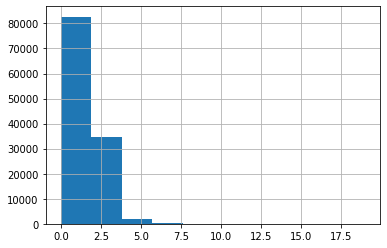

In [20]:
AllHotel.stays_in_weekend_nights.hist()

<AxesSubplot:>

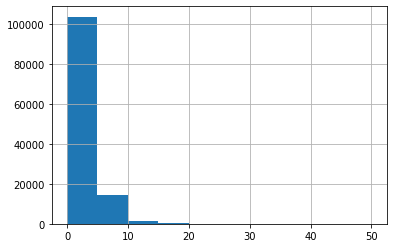

In [21]:
AllHotel.stays_in_week_nights.hist()

C:\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_of_special_requests', ylabel='Density'>

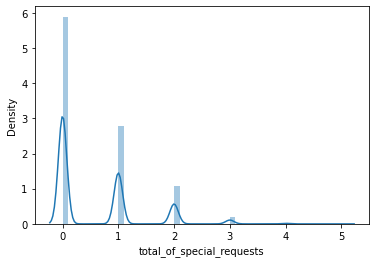

In [22]:
sns.distplot(AllHotel['total_of_special_requests'])

C:\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='arrival_date_week_number', ylabel='Density'>

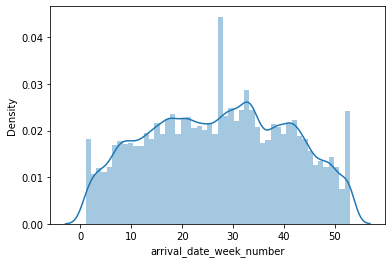

In [23]:
sns.distplot(AllHotel['arrival_date_week_number'])

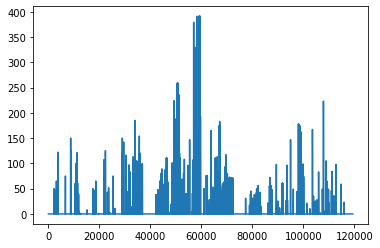

In [24]:
plt.plot(AllHotel["reservation_id"], AllHotel["days_in_waiting_list"])

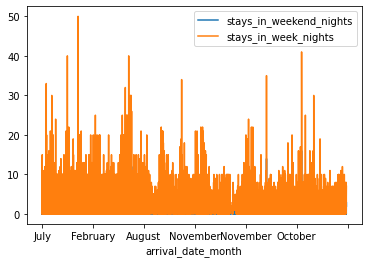

In [25]:
AllHotel.plot(x="arrival_date_month", y=["stays_in_weekend_nights", "stays_in_week_nights"])
plt.show()

In [26]:
import random
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.contingency_tables as ct
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.weightstats import ztest
import matplotlib.pyplot as plt 
plt.style.use('default')
plt.style.use ('seaborn-darkgrid')

<AxesSubplot:>

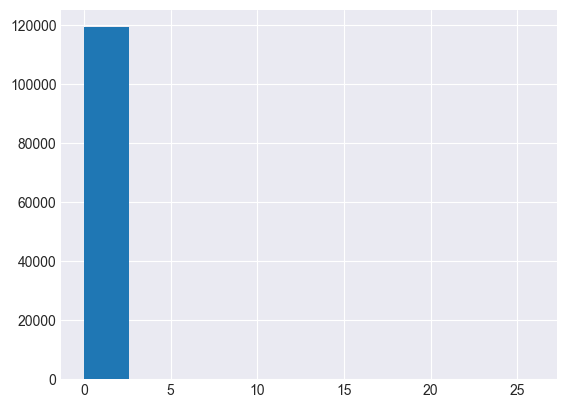

In [27]:
AllHotel['previous_cancellations'].hist()

<AxesSubplot:>

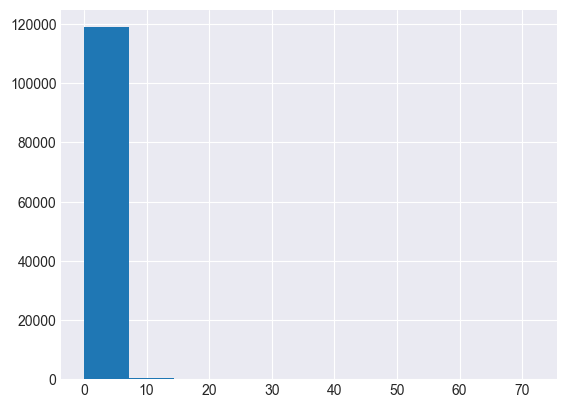

In [28]:
AllHotel['previous_bookings_not_canceled'].hist()

## Statistical analysis - Check for Assumptions

In [29]:
stats.ttest_rel(AllHotel['previous_cancellations'], AllHotel['previous_bookings_not_canceled'])

Ttest_relResult(statistic=-10.774276365886164, pvalue=4.6858747580509295e-27)

>No relation between cancellations and uncancelled bookings pvalue is 4.685. Null accepted

<AxesSubplot:>

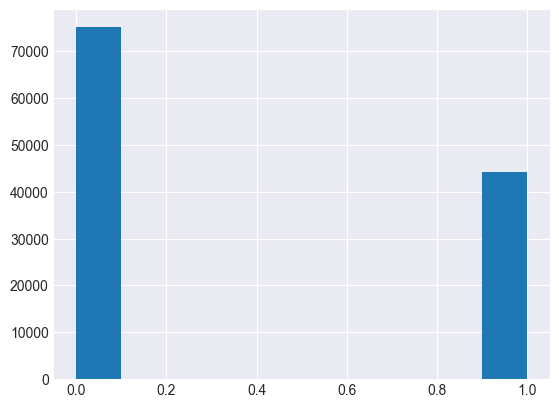

In [30]:
AllHotel['is_canceled'].hist()

<AxesSubplot:>

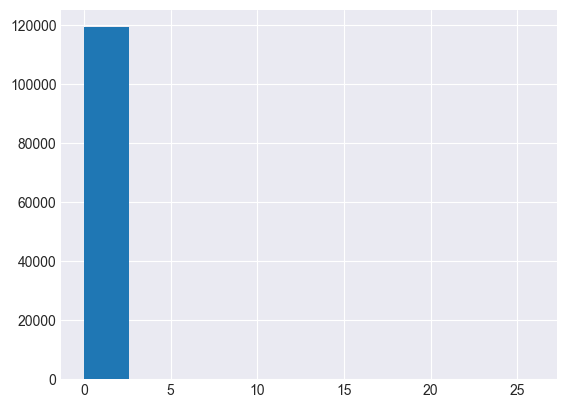

In [31]:
AllHotel['previous_cancellations'].hist()

In [32]:
stats.ttest_rel(AllHotel['is_canceled'], AllHotel['previous_cancellations'])

Ttest_relResult(statistic=106.03983385070737, pvalue=0.0)

 >The realtion between is_canceled and previous_cancellations can conclude that if  
 a person has canceled previously they might have canceled now. 
 Pvalue is less than .05 Null is not accepted

In [33]:
hotelguest = AllHotel[['is_repeated_guest', 'booking_changes']].copy()
print(hotelguest)

        is_repeated_guest  booking_changes
0                       0                3
1                       0                4
2                       0                0
3                       0                0
4                       0                0
...                   ...              ...
112485                  0                0
112486                  0                0
112487                  0                0
112488                  0                0
112489                  0                0

[119490 rows x 2 columns]


> Mann-whitney U Test

In [34]:

stats.mannwhitneyu(x=hotelguest['is_repeated_guest'],
                   y=hotelguest['booking_changes'])

MannwhitneyuResult(statistic=6275642040.0, pvalue=0.0)

### P-value is less than .05 we can reject the null. There is significant difference in booking changes between guest that that are repeated and not repaeated.

> Data Wrangle index

In [35]:
AllHotel[AllHotel.index.duplicated()]

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,500,Resort Hotel,0,13,2015,July,29,17,1,2,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN,07-17-15
1,501,Resort Hotel,1,32,2015,July,29,17,1,2,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,240.0,0,Transient,154.00,0,0,Canceled,2015-06-24,NaN,07-17-15
2,502,Resort Hotel,0,315,2015,July,29,17,1,2,2,0,0,BB,IRL,Offline TA/TO,TA/TO,0,0,0,A,D,0,No Deposit,171.0,0,Transient,96.30,0,0,Check-Out,2015-07-20,NaN,07-17-15
3,503,Resort Hotel,0,8,2015,July,29,17,1,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,D,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN,07-17-15
4,504,Resort Hotel,1,0,2015,July,29,17,0,1,2,0,0,BB,PRT,Direct,Direct,0,0,0,L,C,0,No Deposit,NaN,0,Transient,136.00,0,0,Canceled,2015-07-17,NaN,07-17-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,13395,Resort Hotel,1,300,2017,August,33,13,2,5,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,G,G,0,No Deposit,241.0,0,Transient,219.60,0,0,Canceled,2016-10-17,NaN,08-13-17
6496,13396,Resort Hotel,1,285,2017,August,33,13,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,138.38,0,1,Canceled,2016-11-13,NaN,08-13-17
6497,13397,Resort Hotel,1,102,2017,August,33,13,3,5,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,196.0,0,Transient,230.00,0,0,Canceled,2017-05-17,NaN,08-13-17
6498,13398,Resort Hotel,1,216,2017,August,33,13,4,6,2,1,0,HB,GBR,Direct,Direct,0,0,0,A,A,1,No Deposit,250.0,0,Transient,180.50,0,0,Canceled,2017-08-05,NaN,08-13-17


In [36]:
AllHotel.reset_index(drop=True, inplace=True)
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17
119486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17
119487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17
119488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17


>Make the New Dataset into a CSV file in Drive

In [37]:
AllHotel.to_csv('AllHotel.csv')

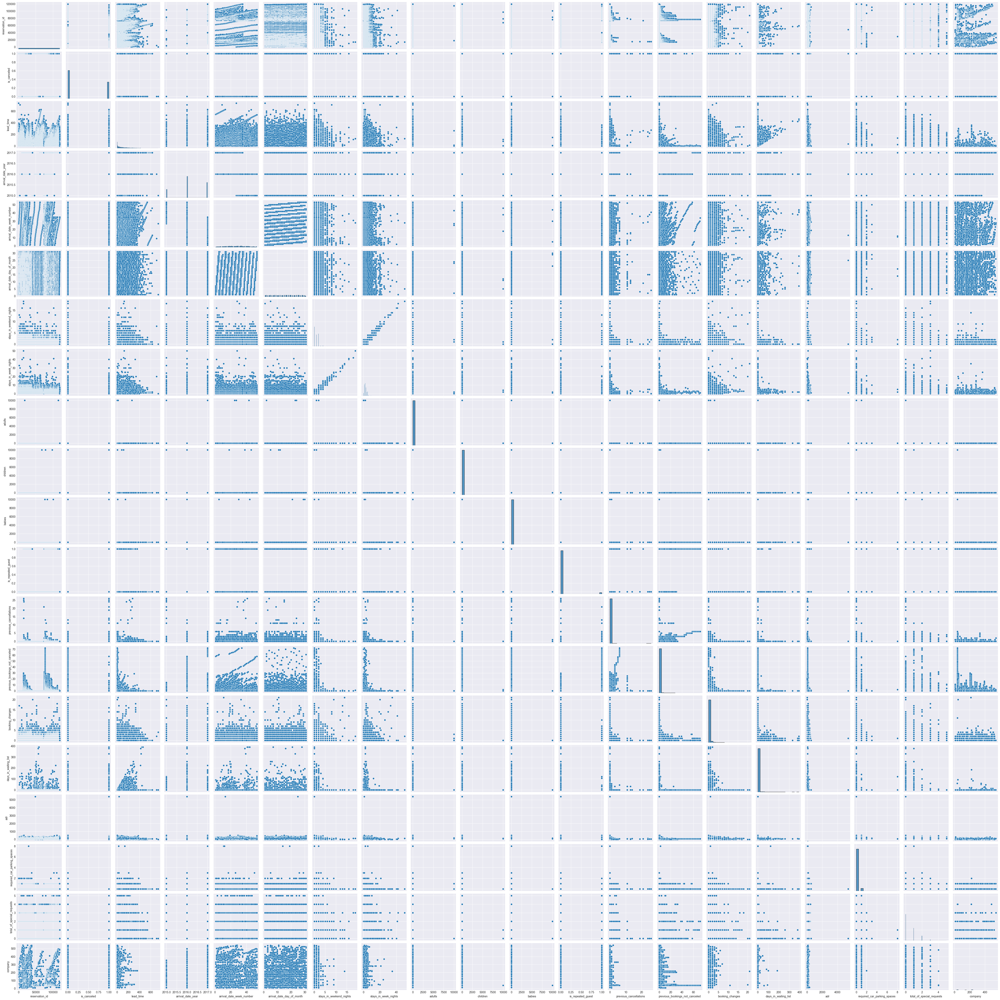

In [38]:
sns.pairplot(AllHotel)

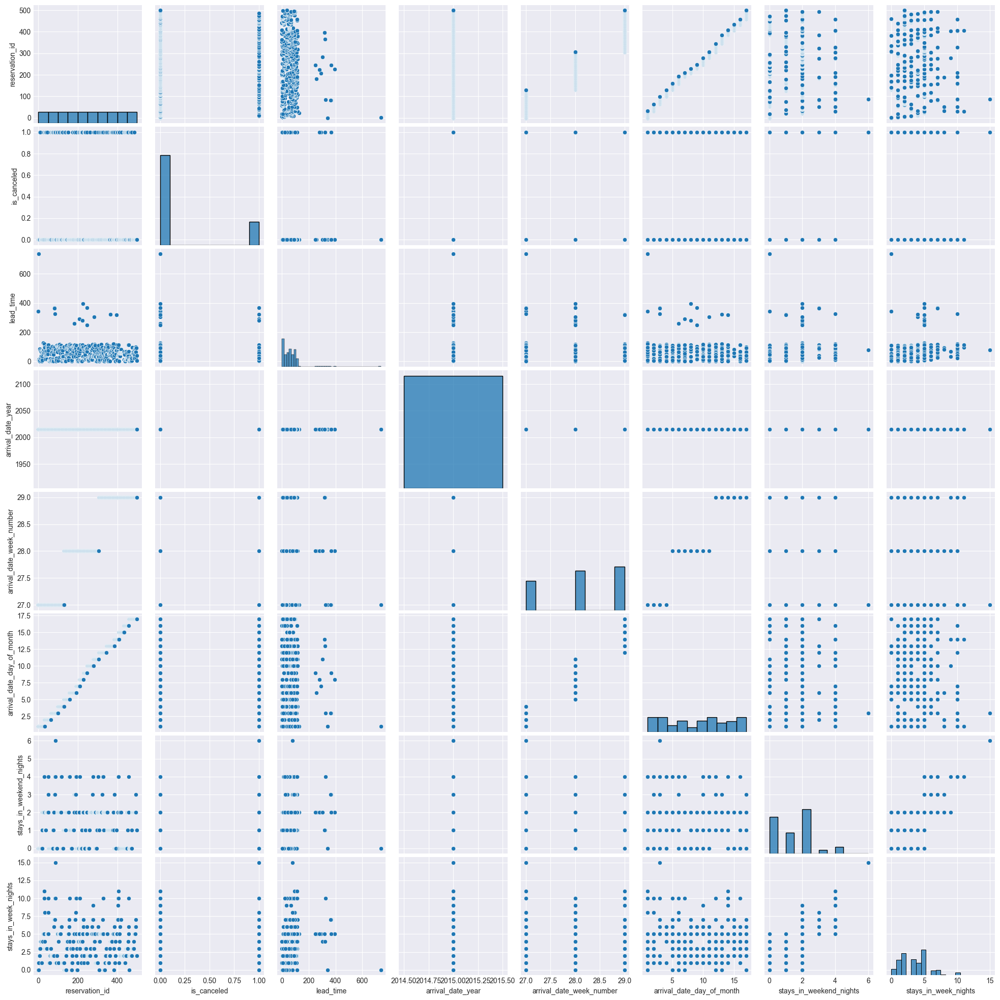

In [39]:
sns.pairplot(hotel1)

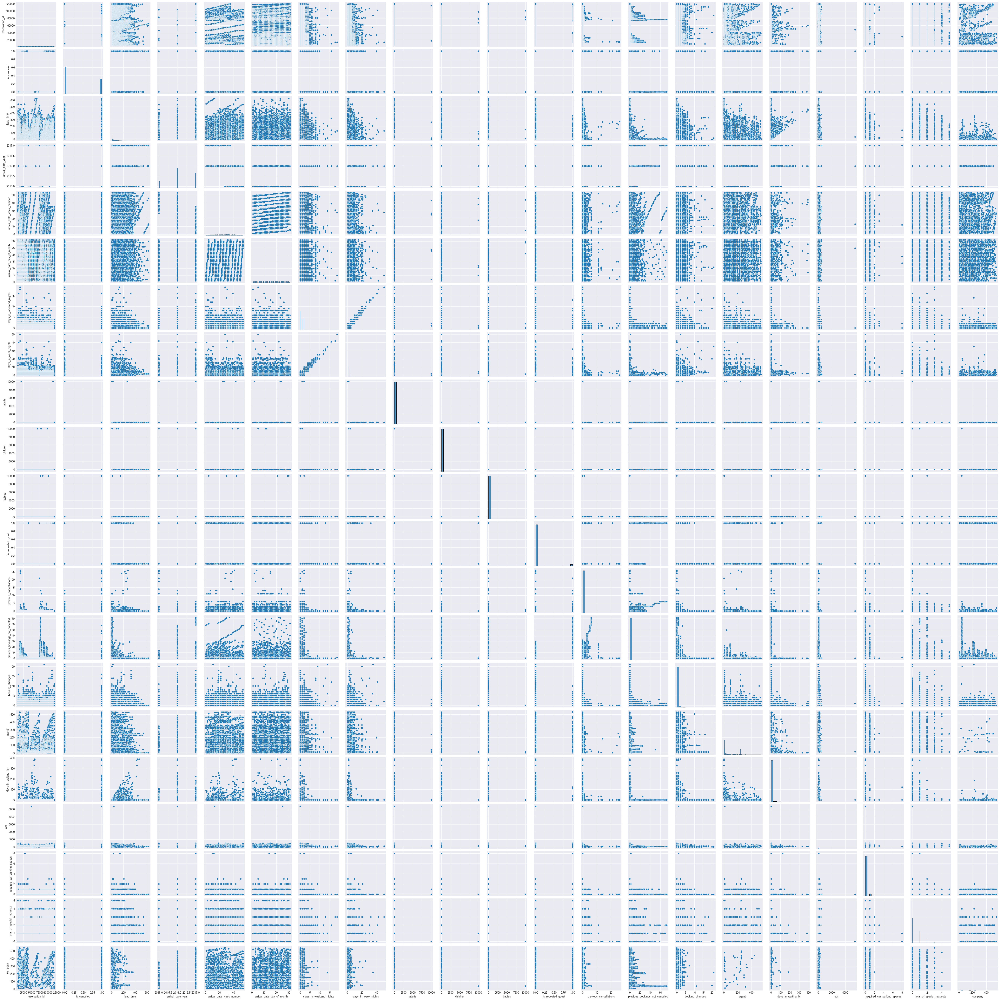

In [40]:
sns.pairplot(hotel4)

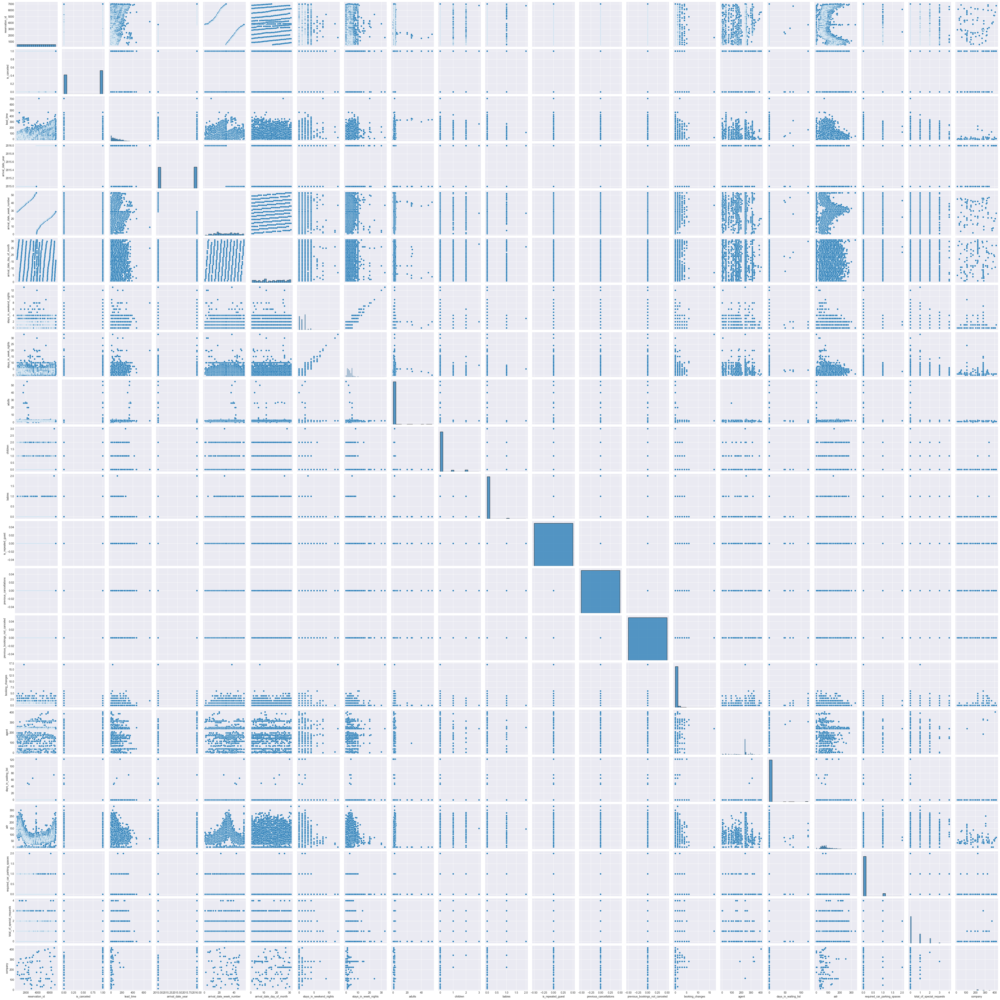

In [41]:
sns.pairplot(hotel3)

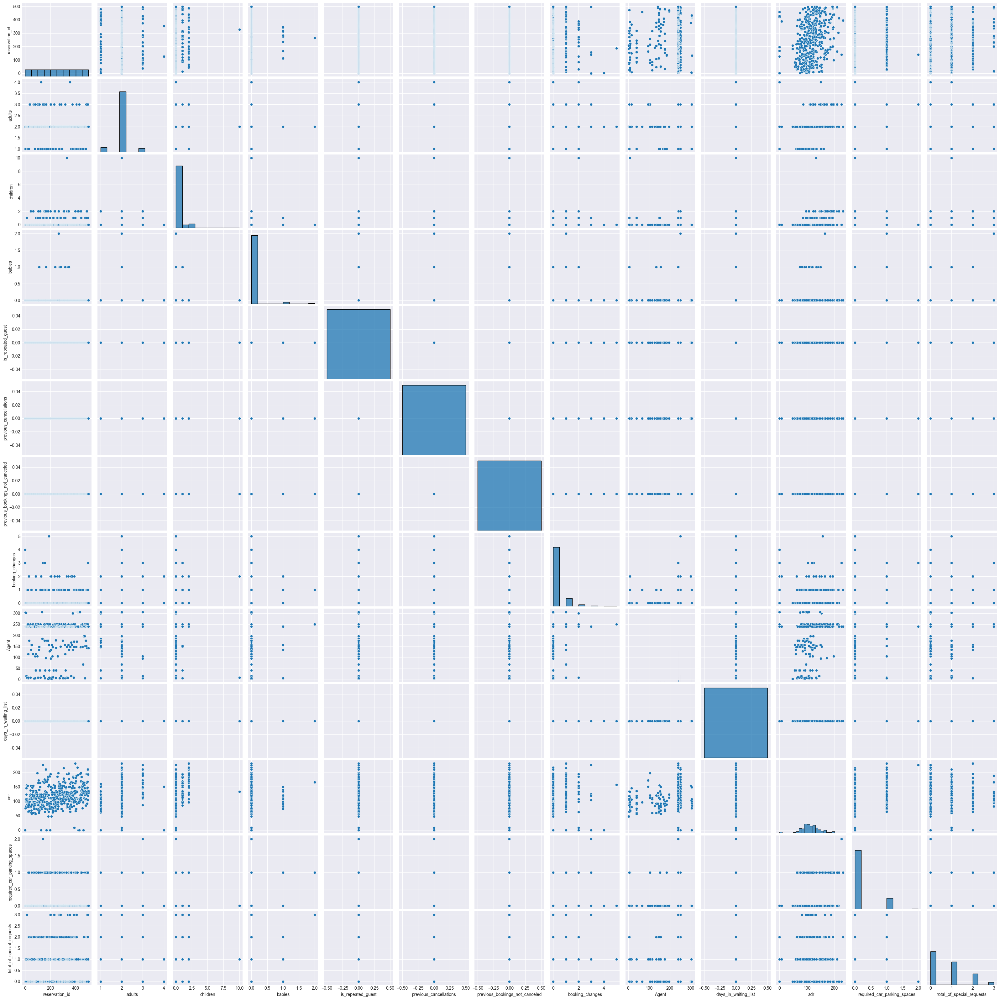

In [42]:
sns.pairplot(hotel2)

## Independant and Dependant variables

In [43]:
X = AllHotel.iloc[:, :-1].values
X

array([[0, 'Resort Hotel', 0, ..., 'Check-Out',
        Timestamp('2015-07-01 00:00:00'), nan],
       [1, 'Resort Hotel', 0, ..., 'Check-Out',
        Timestamp('2015-07-01 00:00:00'), nan],
       [2, 'Resort Hotel', 0, ..., 'Check-Out',
        Timestamp('2015-07-02 00:00:00'), nan],
       ...,
       [119387, 'City Hotel', 0, ..., 'Check-Out',
        Timestamp('2017-09-07 00:00:00'), nan],
       [119388, 'City Hotel', 0, ..., 'Check-Out',
        Timestamp('2017-09-07 00:00:00'), nan],
       [119389, 'City Hotel', 0, ..., 'Check-Out',
        Timestamp('2017-09-07 00:00:00'), nan]], dtype=object)

In [44]:
y = AllHotel.iloc[:,-1].values
y

array(['07-01-15', '07-01-15', '07-01-15', ..., '08-31-17', '08-31-17',
       '08-29-17'], dtype=object)

## Finding Linear Regressions

In [62]:
x = AllHotel['arrival_date_day_of_month']
y = AllHotel['lead_time']
model_hotel = sm.OLS(y,x).fit()
print (model_hotel)

In [46]:
pred_hotel = model_hotel.fittedvalues.copy()
pred_hotel

0           5.039342
1           5.039342
2           5.039342
3           5.039342
4           5.039342
             ...    
119485    151.180245
119486    156.219587
119487    156.219587
119488    156.219587
119489    146.140904
Length: 119490, dtype: float64

In [47]:
true_hotel = AllHotel['lead_time'].values.copy()
true_hotel

array([342, 737,   7, ...,  34, 109, 205], dtype=int64)

In [48]:
residual_hotel = true_hotel - pred_hotel
residual_hotel

0         336.960658
1         731.960658
2           1.960658
3           7.960658
4           8.960658
             ...    
119485   -128.180245
119486    -54.219587
119487   -122.219587
119488    -47.219587
119489     58.859096
Length: 119490, dtype: float64

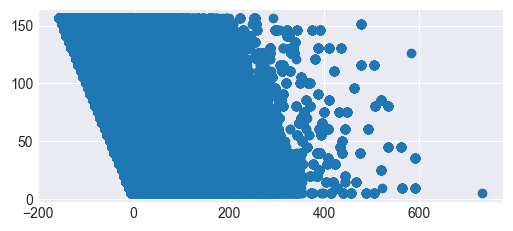

In [49]:
fig, ax = plt.subplots(figsize=(6,2.5))
_ = ax.scatter(residual_hotel, pred_hotel)


In [50]:
AllHotel.corr()

,reservation_id,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,company
reservation_id,1.000000,-0.243242,0.006054,0.299025,-0.053706,0.009769,-0.147713,-0.205538,0.003218,0.002963,0.003892,-0.017930,-0.017939,-0.000075,-0.006630,-0.014481,0.145876,-0.130936,0.104875,-0.211601
is_canceled,-0.243242,1.000000,0.292995,0.016446,0.008266,-0.006395,-0.001486,0.025284,-0.003151,-0.000347,-0.000452,-0.084902,0.109965,-0.057403,-0.144308,0.054028,0.048521,-0.195639,-0.234372,-0.020335
lead_time,0.006054,0.292995,1.000000,0.040026,0.126856,0.002099,0.086081,0.166148,0.000864,-0.002020,-0.002325,-0.124415,0.085950,-0.073545,0.000049,0.169932,-0.063093,-0.116288,-0.094952,0.151387
arrival_date_year,0.299025,0.016446,0.040026,1.000000,-0.540571,-0.000162,0.021405,0.030732,0.001596,-0.000674,-0.003496,0.010375,-0.119800,0.029234,0.030870,-0.056471,0.197251,-0.013657,0.108445,0.258899
arrival_date_week_number,-0.053706,0.008266,0.126856,-0.540571,1.000000,0.066768,0.018247,0.015625,0.001958,0.002562,-0.000287,-0.030151,0.035489,-0.020914,0.005500,0.022918,0.075842,0.001905,0.026158,-0.076732
arrival_date_day_of_month,0.009769,-0.006395,0.002099,-0.000162,0.066768,1.000000,-0.016465,-0.028347,0.000288,-0.003574,0.006205,-0.006096,-0.026981,-0.000275,0.010628,0.022761,0.030008,0.008694,0.002990,0.044463
stays_in_weekend_nights,-0.147713,-0.001486,0.086081,0.021405,0.018247,-0.016465,1.000000,0.499234,0.004769,-0.002617,-0.001275,-0.087258,-0.012805,-0.042726,0.063275,-0.054170,0.049502,-0.018659,0.072880,0.066704
stays_in_week_nights,-0.205538,0.025284,0.166148,0.030732,0.015625,-0.028347,0.499234,1.000000,-0.002864,0.000788,-0.003026,-0.097278,-0.014042,-0.048760,0.096109,-0.002095,0.065582,-0.024975,0.068341,0.182146
adults,0.003218,-0.003151,0.000864,0.001596,0.001958,0.000288,0.004769,-0.002864,1.000000,-0.000018,-0.000078,-0.002602,-0.000595,-0.001707,0.007947,-0.000757,0.003604,0.005704,-0.002191,0.208721
children,0.002963,-0.000347,-0.002020,-0.000674,0.002562,-0.003574,-0.002617,0.000788,-0.000018,1.000000,-0.000036,0.008335,-0.000714,0.001605,-0.001311,-0.000926,0.003378,-0.000829,-0.000857,-0.013720


<AxesSubplot:>

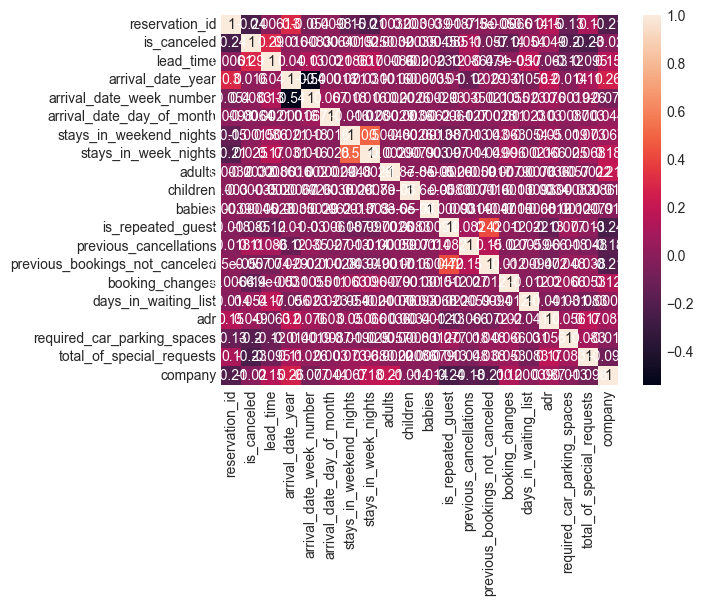

In [51]:
sns.heatmap(AllHotel.corr(), annot=True)

In [52]:
sms.linear_harvey_collier(model_hotel)

Ttest_1sampResult(statistic=81.60256745451774, pvalue=0.0)

> Data is Homoscedsticity

In [53]:
transformed, _ = boxcox(AllHotel['arrival_date_day_of_month'])

(array([ 7681., 11935.,  7498., 11600., 11480., 12136., 12460., 15011.,
        16102., 13587.]),
 array([ 0.        ,  1.53754645,  3.0750929 ,  4.61263934,  6.15018579,
         7.68773224,  9.22527869, 10.76282514, 12.30037158, 13.83791803,
        15.37546448]),
 <BarContainer object of 10 artists>)

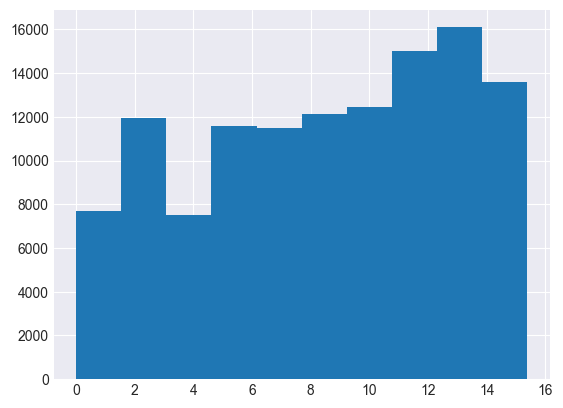

In [54]:
plt.hist(transformed)

In [55]:
x = transformed
model1H = sm.OLS(y,x).fit()
model1H.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              lead_time   R-squared (uncentered):                   0.386
Model:                            OLS   Adj. R-squared (uncentered):              0.386
Method:                 Least Squares   F-statistic:                          7.505e+04
Date:                Tue, 15 Nov 2022   Prob (F-statistic):                        0.00
Time:                        15:32:49   Log-Likelihood:                     -7.3849e+05
No. Observations:              119490   AIC:                                  1.477e+06
Df Residuals:                  119489   BIC:                                  1.477e+06
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             9.7023      0.035    273.944      0.000       9.633       9.772
==============================================================================
Omnibus:                    19463.464   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31994.676
Skew:                           1.104   Prob(JB):                         0.00
Kurtosis:                       4.245   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [56]:
pred_h2 = model1H.fittedvalues.copy()
true_h2 = AllHotel['lead_time'].values.copy()
residual_h2 = true_h2 - pred_h2
residual_h2

0         342.000000
1         737.000000
2           7.000000
3          13.000000
4          14.000000
             ...    
119485   -122.342573
119486    -47.177880
119487   -115.177880
119488    -40.177880
119489     63.527617
Length: 119490, dtype: float64

In [58]:
model_hotel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              lead_time   R-squared (uncentered):                   0.373
Model:                            OLS   Adj. R-squared (uncentered):              0.373
Method:                 Least Squares   F-statistic:                          7.099e+04
Date:                Tue, 15 Nov 2022   Prob (F-statistic):                        0.00
Time:                        15:41:53   Log-Likelihood:                     -7.3974e+05
No. Observations:              119490   AIC:                                  1.479e+06
Df Residuals:                  119489   BIC:                                  1.479e+06
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
arrival_date_day_of_month     5.0393      0.019    266.447      0.000       5.002       5.076
==============================================================================
Omnibus:                    18654.205   Durbin-Watson:                   0.645
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            30138.796
Skew:                           1.072   Prob(JB):                         0.00
Kurtosis:                       4.206   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [59]:
model1H.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              lead_time   R-squared (uncentered):                   0.386
Model:                            OLS   Adj. R-squared (uncentered):              0.386
Method:                 Least Squares   F-statistic:                          7.505e+04
Date:                Tue, 15 Nov 2022   Prob (F-statistic):                        0.00
Time:                        15:42:01   Log-Likelihood:                     -7.3849e+05
No. Observations:              119490   AIC:                                  1.477e+06
Df Residuals:                  119489   BIC:                                  1.477e+06
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             9.7023      0.035    273.944      0.000       9.633       9.772
==============================================================================
Omnibus:                    19463.464   Durbin-Watson:                   0.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31994.676
Skew:                           1.104   Prob(JB):                         0.00
Kurtosis:                       4.245   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

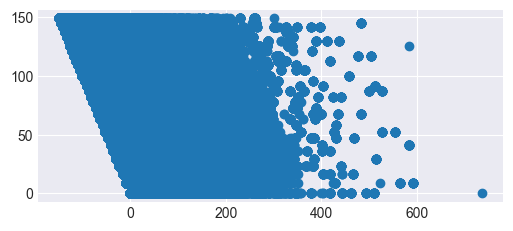

In [60]:
fig, ax = plt.subplots(figsize=(6, 2.5))
_ = ax.scatter(residual_h2, pred_h2)

### Logistic Regression

In [66]:
x = AllHotel['lead_time']
y = AllHotel['is_canceled']

In [67]:
logit = sm.Logit(y,x)
results = logit.fit()
print(results.summary2())

Optimization terminated successfully.
         Current function value: 0.692891
         Iterations 3
                          Results: Logit
Model:              Logit            Pseudo R-squared: -0.051     
Dependent Variable: is_canceled      AIC:              165589.0710
Date:               2022-11-15 16:03 BIC:              165598.7620
No. Observations:   119490           Log-Likelihood:   -82794.    
Df Model:           0                LL-Null:          -78793.    
Df Residuals:       119489           LLR p-value:      nan        
Converged:          1.0000           Scale:            1.0000     
No. Iterations:     3.0000                                        
--------------------------------------------------------------------
               Coef.    Std.Err.     z      P>|z|    [0.025   0.975]
--------------------------------------------------------------------
lead_time      0.0003     0.0000   7.8214   0.0000   0.0002   0.0004



> P>|z| is a significant predictor of whether the person canceled or not and every booking has a likelihood of canceling by .03%. The number of canceled bookings does not have a impact by looking at the Pseudo R-squared of -5.1%.

### Linear Regression

> Finding Normal Distribution

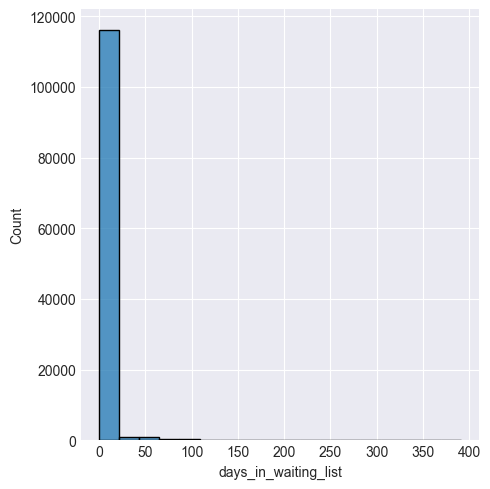

In [69]:
sns.displot(AllHotel['days_in_waiting_list'])

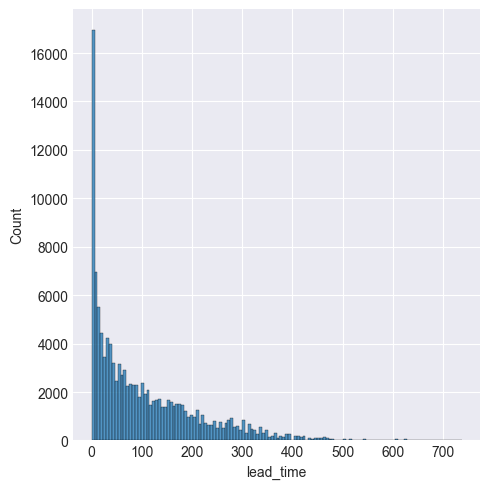

In [70]:
sns.displot(AllHotel['lead_time'])

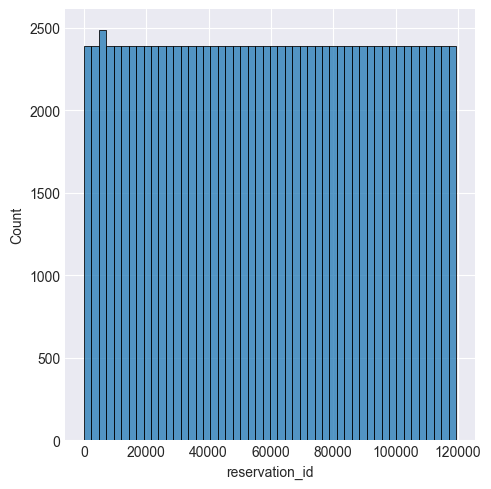

In [71]:
sns.displot(AllHotel['reservation_id'])

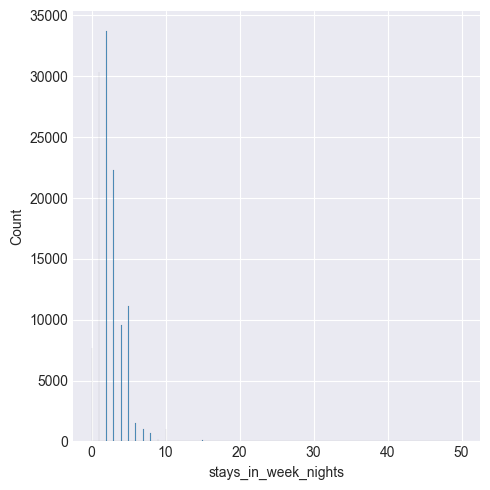

In [74]:
sns.displot(AllHotel['stays_in_week_nights'])

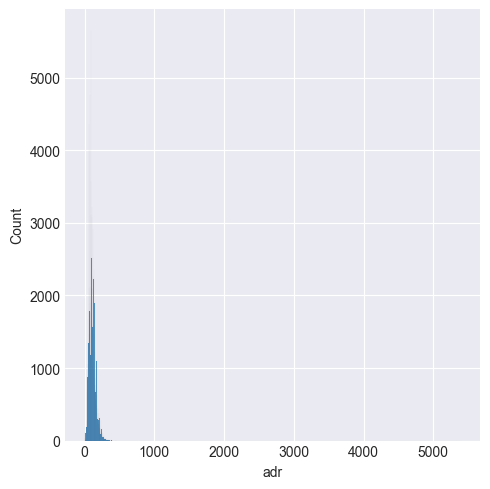

In [76]:
sns.displot(AllHotel['adr'])

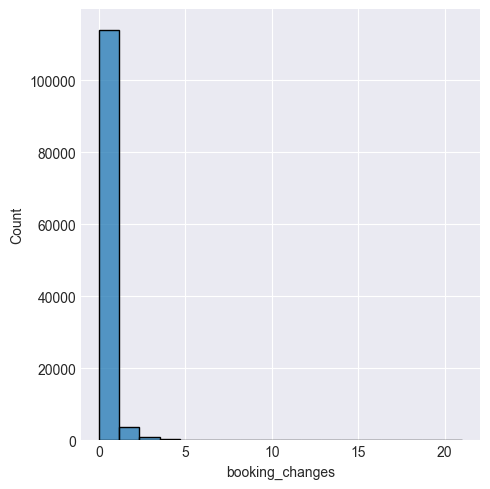

In [77]:
sns.displot(AllHotel['booking_changes'])

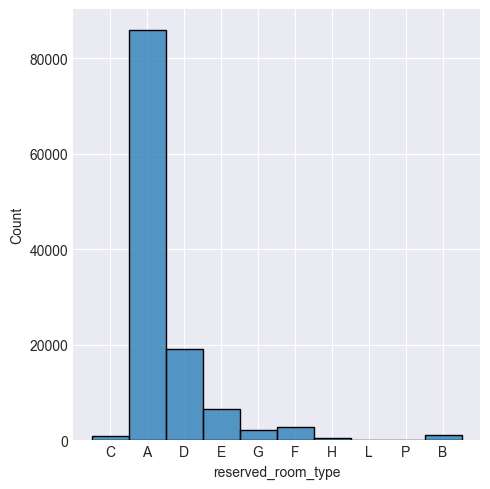

In [78]:
sns.displot(AllHotel['reserved_room_type'])

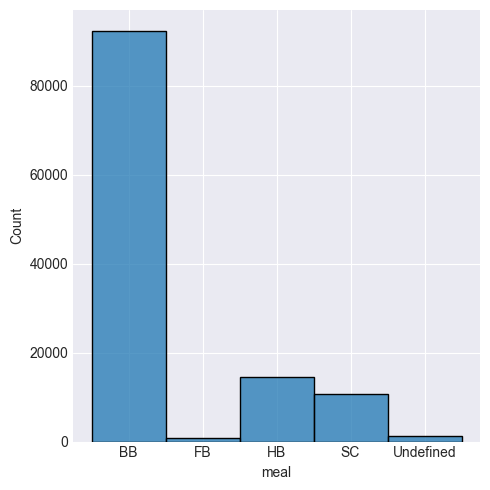

In [79]:
sns.displot(AllHotel['meal'])

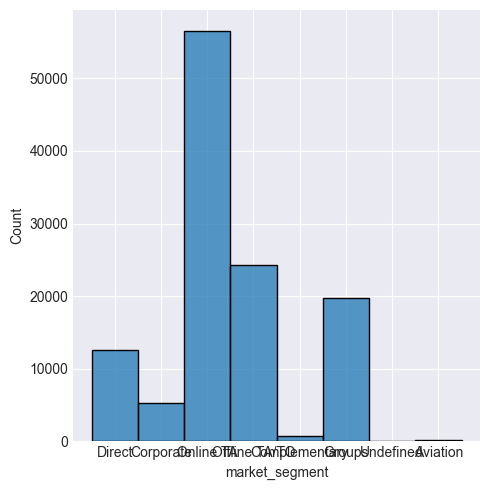

In [80]:
sns.displot(AllHotel['market_segment'])

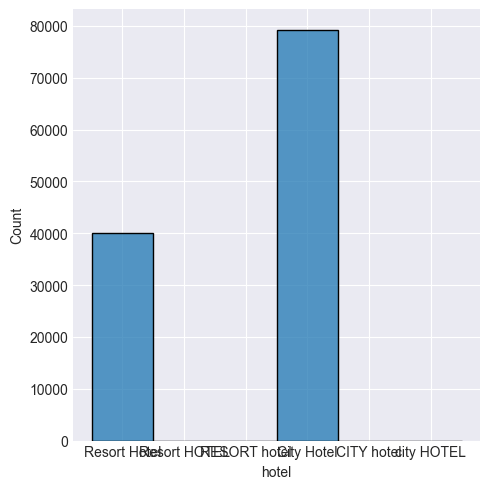

In [81]:
sns.displot(AllHotel['hotel'])

In [90]:
x = AllHotel['adr']
y= AllHotel['stays_in_week_nights']

In [91]:
model = sm.OLS(y,x).fit()

In [92]:
pred_val = model.fittedvalues.copy()
true_val = AllHotel['stays_in_week_nights'].values.copy()
residual = true_val - pred_val

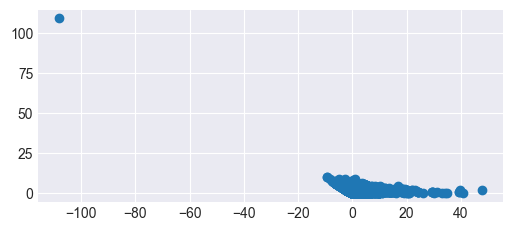

In [93]:
fig, ax = plt.subplots(figsize=(6, 2.5))
_ = ax.scatter(residual, pred_val)

In [94]:
sms.diagnostic.het_breuschpagan(residual, AllHotel[['adr']])

(5246.879017864966, nan, 5487.808119875382, 0.0)

> F-value to test for Homoscedasticity is 5487.8 (Very Big) It is Statistically Significant; P-value is 0, this means the assumptions of Homoscedasticity has been met.

In [96]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                 
=========================================================================================
Dep. Variable:     stays_in_week_nights   R-squared (uncentered):                   0.533
Model:                              OLS   Adj. R-squared (uncentered):              0.533
Method:                   Least Squares   F-statistic:                          1.362e+05
Date:                  Tue, 15 Nov 2022   Prob (F-statistic):                        0.00
Time:                          19:30:16   Log-Likelihood:                     -2.6108e+05
No. Observations:                119490   AIC:                                  5.222e+05
Df Residuals:                    119489   BIC:                                  5.222e+05
Df Model:                             1                                                  
Covariance Type:              nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
adr            0.0202   5.47e-05    368.996      0.000       0.020       0.020
==============================================================================
Omnibus:                    60637.337   Durbin-Watson:                   1.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         30237337.047
Skew:                           1.113   Prob(JB):                         0.00
Kurtosis:                      80.899   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

- Omnibus : Greater than 0 - No Normality
- Prob(Omnibus) : 0 - Normality
- Skew: 1.113 (Greater than 0) - feeds off of Omnibus
- Kurtosis: 80.899 - data is Not normal
- Durbin-Watson: 1.014 - Homoscedasticity
- Jarque-Bera (JB): 30237337.047 - Greater than 0 (not normal)
- Prob(JB) : 0
- Cond. No.: 1.00 - low multicollinearity

In [99]:
Hotel_crosstab = pd.crosstab(AllHotel['country'], AllHotel['previous_bookings_not_canceled'])
Hotel_crosstab

previous_bookings_not_canceled,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72
country,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ABW,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AGO,344,13,3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
AIA,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ALB,12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VGB,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
VNM,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ZAF,79,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [100]:
stats.chi2_contingency(Hotel_crosstab)

(3358.3666406908587,
 1.0,
 12744,
 array([[9.71454501e-01, 1.22013731e-02, 4.50408813e-03, ...,
         8.40314950e-06, 8.40314950e-06, 8.40314950e-06],
        [1.94290900e+00, 2.44027461e-02, 9.00817626e-03, ...,
         1.68062990e-05, 1.68062990e-05, 1.68062990e-05],
        [3.51666529e+02, 4.41689705e+00, 1.63047990e+00, ...,
         3.04194012e-03, 3.04194012e-03, 3.04194012e-03],
        ...,
        [7.77163601e+01, 9.76109846e-01, 3.60327051e-01, ...,
         6.72251960e-04, 6.72251960e-04, 6.72251960e-04],
        [1.94290900e+00, 2.44027461e-02, 9.00817626e-03, ...,
         1.68062990e-05, 1.68062990e-05, 1.68062990e-05],
        [3.88581800e+00, 4.88054923e-02, 1.80163525e-02, ...,
         3.36125980e-05, 3.36125980e-05, 3.36125980e-05]]))

> No Significant relationship between country and previous booking. The country does not follow regular bookings.

In [103]:
Hotel_crosstab2 = pd.crosstab(AllHotel['meal'], AllHotel['adr'])
Hotel_crosstab2

adr        -6.38      0.00      0.26      0.50      1.00      1.29     \
meal                                                                    
BB                1      1495         0         1        10         1   
FB                0        16         0         0         0         0   
HB                0       201         0         0         4         0   
SC                0       209         1         0         1         0   
Undefined         0        38         0         0         0         0   

adr         1.48      1.56      1.60      1.80      2.00      2.40     \
meal                                                                    
BB                1         0         1         0         8         0   
FB                0         0         0         0         0         0   
HB                0         0         0         1         2         0   
SC                0         2         0         0         2         1   
Undefined         0         0         0         0         0         0   

adr         3.00      3.38      4.00      4.50      5.00      5.20     \
meal                                                                    
BB                1         0        21         1         1         1   
FB                0         0         0         0         0         0   
HB                2         0         0         0         0         0   
SC                1         1         0         2         0         0   
Undefined         0         0         0         0         0         0   

adr         5.25      6.00      6.40      6.50      6.67      6.90     \
meal                                                                    
BB                1        66         0         1         1         1   
FB                0         0         0         0         0         0   
HB                1         0         0         0         0         0   
SC                0         2         1         0         0         0   
Undefined         0         0         0         0         0         0   

adr         7.00      7.80      8.00      8.34      8.43      9.00     \
meal                                                                    
BB                3         1       101         0         0        10   
FB                0         0         0         0         0         0   
HB                0         0         0         0         0         0   
SC                0         0         1         1         1         0   
Undefined         0         0         0         0         0         0   

adr         9.14      9.67      9.71      10.00     10.50     10.80    \
meal                                                                    
BB                0         1         1         6         0         2   
FB                0         0         0         0         0         0   
HB                0         0         0         0         0         0   
SC                1         0         0         0         1         0   
Undefined         0         0         0         0         0         0   

adr         11.53     11.75     12.00     12.50     13.00     14.00    \
meal                                                                    
BB                0         1        93         0         0         6   
FB                0         0         0         0         0         0   
HB                0         0         0         0         3         0   
SC                1         0         0         1         0         0   
Undefined         0         0         0         0         0         0   

adr         15.00     16.00     16.92     17.50     17.60     18.00    \
meal                                                                    
BB                6         1         0         1         1         6   
FB                0         0         0         0         0         0   
HB                0         0         0         0        10         0   
SC                0         0         1         0  

In [104]:
stats.chi2_contingency(Hotel_crosstab2)

(135470.53163395444,
 0.0,
 35512,
 array([[7.73261361e-01, 1.51481901e+03, 7.73261361e-01, ...,
         7.73261361e-01, 7.73261361e-01, 7.73261361e-01],
        [6.67838313e-03, 1.30829525e+01, 6.67838313e-03, ...,
         6.67838313e-03, 6.67838313e-03, 6.67838313e-03],
        [1.21139844e-01, 2.37312955e+02, 1.21139844e-01, ...,
         1.21139844e-01, 1.21139844e-01, 1.21139844e-01],
        [8.91287974e-02, 1.74603314e+02, 8.91287974e-02, ...,
         8.91287974e-02, 8.91287974e-02, 8.91287974e-02],
        [9.79161436e-03, 1.91817725e+01, 9.79161436e-03, ...,
         9.79161436e-03, 9.79161436e-03, 9.79161436e-03]]))

> There is a significant relationship between ADR(average daily rate) and the meal plan.  The Hotel's Daily Rate will give indication to what kind of meal is being offered.